In [1]:
import pandas as pd

In [8]:
# (1) Используя параметры read_csv из pandas прочитать файл csv так,
# чтобы данные были разбиты по соответствующим колонкам 
# (а не все слилось в одну)
df = pd.read_csv ('C:\\Users\\Elena\\Documents\\Skillfactory\\lesson 1\\HW_lesson01\\HW_lesson_01\\UCI_Credit_Card.csv')

In [9]:
df.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
0,1,20000.0,2,2,1,24,2,2,-1,-1,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
1,2,120000.0,2,2,2,26,-1,2,0,0,...,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
2,3,90000.0,2,2,2,34,0,0,0,0,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
3,4,50000.0,2,2,1,37,0,0,0,0,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
4,5,50000.0,1,2,1,57,-1,0,-1,0,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0


In [17]:
# (2) выведите, что за типы переменных, сколько пропусков,
# для численных значений посчитайте пару статистик (в свободной форме)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 25 columns):
ID                            30000 non-null int64
LIMIT_BAL                     30000 non-null float64
SEX                           30000 non-null int64
EDUCATION                     30000 non-null int64
MARRIAGE                      30000 non-null int64
AGE                           30000 non-null int64
PAY_0                         30000 non-null int64
PAY_2                         30000 non-null int64
PAY_3                         30000 non-null int64
PAY_4                         30000 non-null int64
PAY_5                         30000 non-null int64
PAY_6                         30000 non-null int64
BILL_AMT1                     30000 non-null float64
BILL_AMT2                     30000 non-null float64
BILL_AMT3                     30000 non-null float64
BILL_AMT4                     30000 non-null float64
BILL_AMT5                     30000 non-null float64
BILL_AMT6   

In [18]:
#TODO
print(df.info())
print(df[['LIMIT_BAL','AGE','PAY_0','BILL_AMT1','PAY_AMT1']].describe())
print (df.groupby(['EDUCATION'],sort=True)['AGE'].min())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 25 columns):
ID                            30000 non-null int64
LIMIT_BAL                     30000 non-null float64
SEX                           30000 non-null int64
EDUCATION                     30000 non-null int64
MARRIAGE                      30000 non-null int64
AGE                           30000 non-null int64
PAY_0                         30000 non-null int64
PAY_2                         30000 non-null int64
PAY_3                         30000 non-null int64
PAY_4                         30000 non-null int64
PAY_5                         30000 non-null int64
PAY_6                         30000 non-null int64
BILL_AMT1                     30000 non-null float64
BILL_AMT2                     30000 non-null float64
BILL_AMT3                     30000 non-null float64
BILL_AMT4                     30000 non-null float64
BILL_AMT5                     30000 non-null float64
BILL_AMT6   

In [19]:
# (3) посчитать число женщин с университетским образованием
# SEX (1 = male; 2 = female). 
# EDUCATION (1 = graduate school; 2 = university; 3 = high school; 4 = others). 
print (df[df['SEX'].isin([2]) & df['EDUCATION'].isin([2])]['ID'].count())

8656


In [124]:
# (4) Сгрупировать по "default payment next month" и посчитать медиану для всех показателей начинающихся на BILL_ и PAY_
new=df.loc[:,df.columns.str.contains('BILL_') | df.columns.str.contains('PAY_')|df.columns.str.contains('default.payment.next.month')]
print (new.groupby(['default.payment.next.month'],sort=False).median())


                            PAY_0  PAY_2  PAY_3  PAY_4  PAY_5  PAY_6  \
default.payment.next.month                                             
1                               1      0      0      0      0      0   
0                               0      0      0      0      0      0   

                            BILL_AMT1  BILL_AMT2  BILL_AMT3  BILL_AMT4  \
default.payment.next.month                                               
1                             20185.0    20300.5    19834.5    19119.5   
0                             23119.5    21660.5    20202.5    19000.0   

                            BILL_AMT5  BILL_AMT6  PAY_AMT1  PAY_AMT2  \
default.payment.next.month                                             
1                             18478.5    18028.5    1636.0    1533.5   
0                             17998.0    16679.0    2459.5    2247.5   

                            PAY_AMT3  PAY_AMT4  PAY_AMT5  PAY_AMT6  
default.payment.next.month                              

In [91]:
# (5) постройте сводную таблицу (pivot table) по SEX, EDUCATION, MARRIAGE

df.pivot_table #TODO
df.pivot_table(['ID'],['SEX','EDUCATION','MARRIAGE'],aggfunc='count')

ID
SEX EDUCATION MARRIAGE      
1   0         1            2
              2            6
    1         0            1
              1         1690
              2         2633
              3           30
    2         0            1
              1         2370
              2         2940
              3           63
    3         0           12
              1         1048
              2          894
              3           36
    4         1           18
              2           23
              3            1
    5         1           48
              2           46
              3            1
    6         1           14
              2           11
2   0         1            2
              2            4
    1         0            3
              1         2032
              2         4176
              3           20
    2         0            5
              1         4472
              2         4080
              3           99
    3         0           32
              1         1813
              2         1015
              3           67
    4         1           34
              2           45
              3            2
    5         1          102
              2           81
              3            2
    6         1           14
              2           10
              3            2

In [122]:
# (6) Создать новый строковый столбец в data frame-е, который:
# принимает значение A, если значение LIMIT_BAL <=10000
# принимает значение B, если значение LIMIT_BAL <=100000 и >10000
# принимает значение C, если значение LIMIT_BAL <=200000 и >100000
# принимает значение D, если значение LIMIT_BAL <=400000 и >200000
# принимает значение E, если значение LIMIT_BAL <=700000 и >400000
# принимает значение F, если значение LIMIT_BAL >700000

#TODO
df['new']=""
df.loc[df.LIMIT_BAL<=10000,'new']='A' 
df.loc[(df.LIMIT_BAL>10000) & (df.LIMIT_BAL<=100000),'new']='B' 
df.loc[(df.LIMIT_BAL>100000) & (df.LIMIT_BAL<=200000),'new']='C'
df.loc[(df.LIMIT_BAL>200000) & (df.LIMIT_BAL<=400000),'new']='D'
df.loc[(df.LIMIT_BAL>400000) & (df.LIMIT_BAL<=700000),'new']='E'
df.loc[df.LIMIT_BAL>700000,'new']='F' 
print(df.head())


   ID  LIMIT_BAL  SEX  EDUCATION  MARRIAGE  AGE  PAY_0  PAY_2  PAY_3  PAY_4  \
0   1    20000.0    2          2         1   24      2      2     -1     -1   
1   2   120000.0    2          2         2   26     -1      2      0      0   
2   3    90000.0    2          2         2   34      0      0      0      0   
3   4    50000.0    2          2         1   37      0      0      0      0   
4   5    50000.0    1          2         1   57     -1      0     -1      0   

  ...   BILL_AMT5  BILL_AMT6  PAY_AMT1  PAY_AMT2  PAY_AMT3  PAY_AMT4  \
0 ...         0.0        0.0       0.0     689.0       0.0       0.0   
1 ...      3455.0     3261.0       0.0    1000.0    1000.0    1000.0   
2 ...     14948.0    15549.0    1518.0    1500.0    1000.0    1000.0   
3 ...     28959.0    29547.0    2000.0    2019.0    1200.0    1100.0   
4 ...     19146.0    19131.0    2000.0   36681.0   10000.0    9000.0   

   PAY_AMT5  PAY_AMT6  default.payment.next.month  new  
0       0.0       0.0              

In [106]:
print(df.head())

   ID  LIMIT_BAL  SEX  EDUCATION  MARRIAGE  AGE  PAY_0  PAY_2  PAY_3  PAY_4  \
0   1    20000.0    2          2         1   24      2      2     -1     -1   
1   2   120000.0    2          2         2   26     -1      2      0      0   
2   3    90000.0    2          2         2   34      0      0      0      0   
3   4    50000.0    2          2         1   37      0      0      0      0   
4   5    50000.0    1          2         1   57     -1      0     -1      0   

  ...   BILL_AMT5  BILL_AMT6  PAY_AMT1  PAY_AMT2  PAY_AMT3  PAY_AMT4  \
0 ...         0.0        0.0       0.0     689.0       0.0       0.0   
1 ...      3455.0     3261.0       0.0    1000.0    1000.0    1000.0   
2 ...     14948.0    15549.0    1518.0    1500.0    1000.0    1000.0   
3 ...     28959.0    29547.0    2000.0    2019.0    1200.0    1100.0   
4 ...     19146.0    19131.0    2000.0   36681.0   10000.0    9000.0   

   PAY_AMT5  PAY_AMT6  default.payment.next.month  new  
0       0.0       0.0              

In [31]:
%matplotlib inline

In [ ]:
# (7) постироить распределение LIMIT_BAL (гистрограмму)

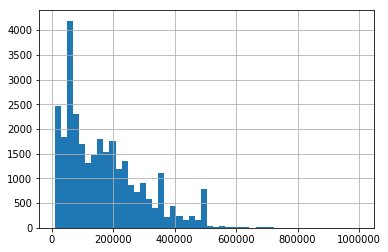

In [36]:
df['LIMIT_BAL'].hist(bins=50)

In [46]:
# (8) построить среднее значение кредитного лимита для каждого вида образования 
# и для каждого пола
# график необходимо сделать очень широким (на весь экран)
 #TODO
%matplotlib notebook
import matplotlib.pyplot as plt
import seaborn as sns

<IPython.core.display.Javascript object>


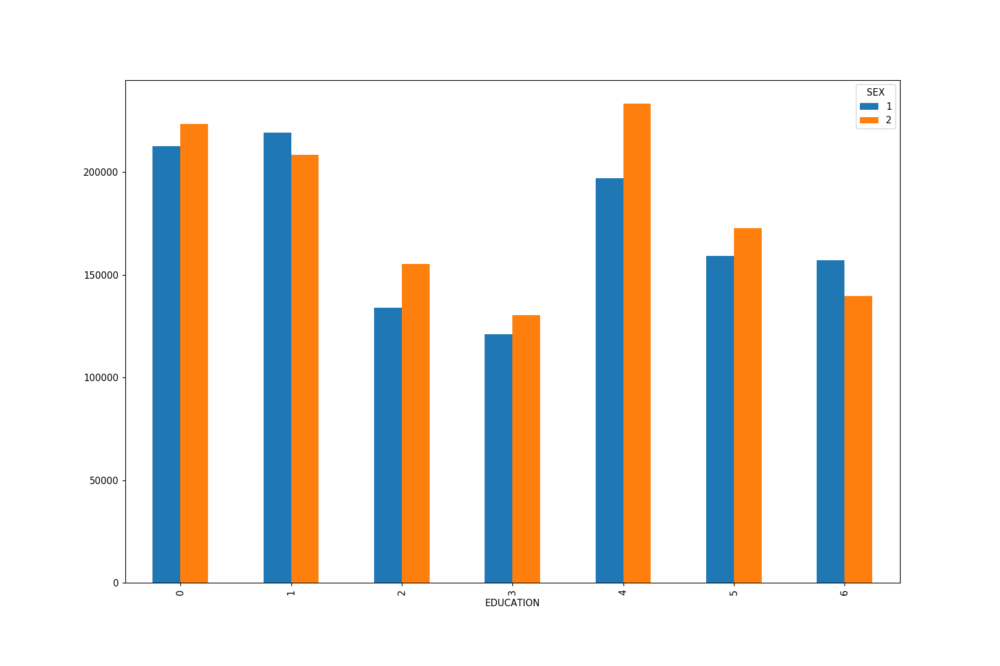

In [58]:
_ , ax_my_lovely = plt.subplots(figsize=(15,10))

df.pivot_table(values='LIMIT_BAL',
                  index='EDUCATION',
                  columns='SEX',
                  aggfunc='mean').plot(
    kind='bar', stacked=False, ax=ax_my_lovely
)

plt.show()

In [95]:
# (9) построить зависимость кредитного лимита и образования только для одного из полов

#TODO
import seaborn as sns

C:\Users\Elena\Anaconda3\lib\site-packages\seaborn\categorical.py:3666: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)
C:\Users\Elena\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


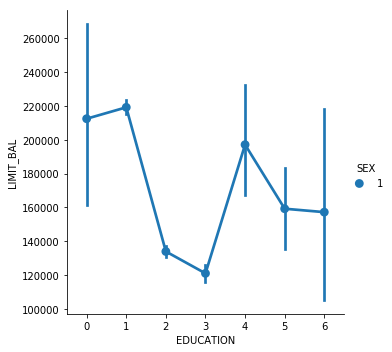

In [29]:
sns.factorplot('EDUCATION','LIMIT_BAL',data=df[df['SEX'] == 1], hue='SEX')

In [96]:
# (10) построить большой график (подсказка - используя seaborn) для построения завимисости всех возможных пар параметров
# разным цветом выделить разные значение "default payment next month"
# (но так как столбцов много - картинка может получиться "монструозной")
# (поэкспериментируйте над тем как построить подобное сравнение параметров)
# (подсказка - ответ может состоять из несколькольких графиков)
# (если не выйдет - программа минимум - построить один график со всеми параметрами)
import seaborn as sns
sns.pairplot(df, hue='default.payment.next.month');
#TODO

<IPython.core.display.Javascript object>

C:\Users\Elena\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
C:\Users\Elena\Anaconda3\lib\site-packages\statsmodels\nonparametric\kde.py:488: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
C:\Users\Elena\Anaconda3\lib\site-packages\statsmodels\nonparametric\kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2
C:\Users\Elena\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:83: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
